# Reproduce AIMS4PT Cpx Figures

This notebook reproduces the paper and supplementary figures for SHAP interpretation, OOD diagnostics, TAS-OOD checks, result comparisons, and regression-slope diagnostics.


In [1]:
from pathlib import Path
import sys

def _find_project_root(start=None):
    """Find the project root by walking upward from the current directory."""
    path = Path.cwd() if start is None else Path(start).resolve()
    for candidate in (path, *path.parents):
        if (candidate / "pyproject.toml").exists():
            return candidate
    raise FileNotFoundError("Could not find pyproject.toml above the current directory.")

PROJECT_ROOT = _find_project_root()
PAPER_DIR = PROJECT_ROOT / "paper"
CACHE_DIR = PAPER_DIR / ".cache"
IMAGES_DIR = PAPER_DIR / ".images"
DATA_DIR = PAPER_DIR / "data"
for _dir in (CACHE_DIR, IMAGES_DIR, DATA_DIR):
    _dir.mkdir(parents=True, exist_ok=True)

if str(PROJECT_ROOT) not in sys.path:
    sys.path.insert(0, str(PROJECT_ROOT))

%load_ext autoreload
%autoreload 2

import pandas as pd
import numpy as np

import os
import time
import importlib
import matplotlib.pyplot as plt
from aims4pt.model_tools.model_registry import  get_models_initial_pools, ALL_MODELS_MODULES
for module in ALL_MODELS_MODULES:
    importlib.import_module(module)



# Independent Experimental Dataset 
Apply cpx oxide-total screening, cpx stoichiometric screening, and Fe-Mg Kd equilibrium filtering.

In [ ]:
unseen_experiments_path = os.path.join(DATA_DIR, "independent_data_raw.xlsx")

unseen_experiments_df = pd.read_excel(unseen_experiments_path)

#col names for unseen_experiments_df
cpx_names = ['SiO2_cpx', 'TiO2_cpx', 'Al2O3_cpx',
        'Cr2O3_cpx', 'FeO_cpx', 'MnO_cpx', 'MgO_cpx', 'NiO_cpx',
       'CaO_cpx', 'Na2O_cpx', 'K2O_cpx', 'P2O5_cpx']
liq_names = ['SiO2_liq', 'TiO2_liq', 'Al2O3_liq',
        'FeO_liq', 'MnO_liq', 'MgO_liq', 
       'CaO_liq', 'Na2O_liq', 'K2O_liq', 'P2O5_liq']
P_col = 'P (kbar)'
T_col = 'T (C)'


## Cleaning and equilibrium filtering



In [3]:
print("Before cleaning, unseen_experiments_df shape:", unseen_experiments_df.shape)
cpx_total = unseen_experiments_df[cpx_names].sum(axis=1)
unseen_experiments_df = unseen_experiments_df[(cpx_total>98)&(cpx_total<102)].reset_index(drop=True)
print("After total, unseen_experiments_df shape:", unseen_experiments_df.shape)
from aims4pt.data_tools.compositions import cpx_calculation
cpx_params = cpx_calculation(unseen_experiments_df[cpx_names])
MdivT= cpx_params["(Ca+Fe+Mg)/Si"]
unseen_experiments_df = unseen_experiments_df[(MdivT>0.9)&(MdivT<1.1)].reset_index(drop=True)
print("After cpx MdivT, unseen_experiments_df shape:", unseen_experiments_df.shape)
# kd filter


from aims4pt.data_tools.equilibrium import kdEquilibrium_test
mask, kd_values = kdEquilibrium_test(
    unseen_experiments_df[cpx_names],
    unseen_experiments_df[liq_names],
    kd = 0.28,
    error = 0.08,
    mode='Fe-Mg',)
unseen_experiments_df = unseen_experiments_df[mask].reset_index(drop=True)
print("After kd filter, unseen_experiments_df shape:", unseen_experiments_df.shape)
liq_total = unseen_experiments_df[liq_names].sum(axis=1)
liq_total.describe()

Before cleaning, unseen_experiments_df shape: (517, 36)
After total, unseen_experiments_df shape: (497, 36)
After cpx MdivT, unseen_experiments_df shape: (441, 36)
After kd filter, unseen_experiments_df shape: (293, 36)


count    293.000000
mean      98.324335
std        2.691512
min       86.971390
25%       97.802000
50%       99.813648
75%      100.000000
max      100.660000
dtype: float64

In [4]:

cpx_unseen = unseen_experiments_df[cpx_names].copy()
liq_unseen = unseen_experiments_df[liq_names].copy()
meta_unseen = unseen_experiments_df[[P_col, T_col]].copy()
# stratified split
from sklearn.model_selection import StratifiedShuffleSplit

sss = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
P_values = unseen_experiments_df[P_col]
target_bin_size = 50
num_bins = max(2, min(10, len(P_values) // target_bin_size))
P_binned = pd.qcut(P_values, q=num_bins, labels=False, duplicates="drop")
(strat_train_idx, strat_test_idx), = sss.split(unseen_experiments_df, P_binned)
training_unseen_id = unseen_experiments_df.iloc[strat_train_idx].index
testing_unseen_id = unseen_experiments_df.iloc[strat_test_idx].index

#random split
# from sklearn.model_selection import train_test_split
# training_unseen_id, testing_unseen_id = train_test_split(
#     unseen_experiments_df.index,
#     test_size=0.2,
#     random_state=42,
#     )


c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\seaborn\distributions.py:1176: UserWarning: The following kwargs were not used by contour: 'linewidth'
  cset = contour_func(


T range:  700.0  -  1350.0
P range:  0.001  -  30.0


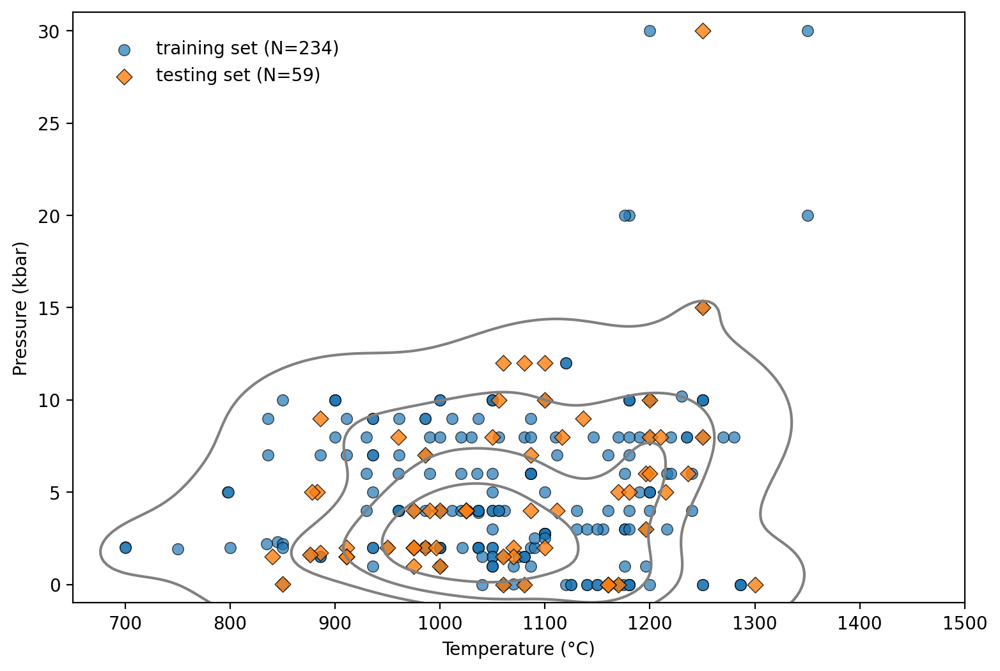

In [5]:
# P-T scatter plot for unseen test set
import seaborn as sns
fig, ax = plt.subplots(figsize=(9, 6), dpi=200)
# training set
ax.scatter(meta_unseen.loc[training_unseen_id][T_col], meta_unseen.loc[training_unseen_id][P_col], 
           alpha=0.7, label=f'training set (N={len(training_unseen_id)})', marker='o', s =40, edgecolors='k', linewidths=0.5)
sns.kdeplot(
    data=meta_unseen,
    x=T_col,
    y=P_col,
    levels=5,
    linewidth = 0.8,
    color = "grey"
)
# testing set
ax.scatter(meta_unseen.loc[testing_unseen_id][T_col], meta_unseen.loc[testing_unseen_id][P_col], 
           alpha=0.8, label=f'testing set (N={len(testing_unseen_id)})', marker='D', s= 40, edgecolors='k', linewidths=0.5)
# sns.kdeplot( 
#     data=meta_unseen,
#     x=T_col,
#     y=P_col,
#     levels=5,
#     color='red',)
ax.set_xlabel("Temperature (°C)")
ax.set_ylabel("Pressure (kbar)")
ax.set_xlim(650,1500)
ax.set_ylim(-1, 31)
# in axes legend upper left
ax_tp = ax.transAxes
ax.legend(loc = 'upper left', frameon=False,
          fontsize=10,         bbox_to_anchor=(0.02, 0.98),          # Upper-left inside the axes.
        bbox_transform=ax_tp  )

# print p t max min
print("T range: ", meta_unseen[T_col].min(), " - ", meta_unseen[T_col].max())
print("P range: ", meta_unseen[P_col].min(), " - ", meta_unseen[P_col].max())


## Comparison with GEORO

In [6]:
run_compare_natural_exp_dataset = False
if run_compare_natural_exp_dataset:
    georoc_df_raw=pd.read_csv(os.path.join(DATA_DIR, "GEOROC_cpx.csv"))

    xy_pairs = [("SiO2", "TiO2"), ("SiO2", "Al2O3"), ("SiO2", "FeO"),
                ("SiO2", "MgO"), ("SiO2", "MnO"), ("SiO2", "CaO"),
                ("SiO2", "Na2O"), ("SiO2", "K2O")]
    georoc_df = georoc_df_raw.rename(columns = {
        "SIO2(WT%)":"SiO2_cpx",
        "TIO2(WT%)":"TiO2_cpx",
        "AL2O3(WT%)":"Al2O3_cpx",
        "FEO(WT%)":"FeO_cpx",
        "MNO(WT%)":"MnO_cpx",
        "MGO(WT%)":"MgO_cpx",
        "CAO(WT%)":"CaO_cpx",
        "NA2O(WT%)":"Na2O_cpx",
        "K2O(WT%)":"K2O_cpx",
        
    })

    interested_cpx_features = ["SiO2_cpx", "TiO2_cpx", "Al2O3_cpx",
    "FeO_cpx", "MnO_cpx", "MgO_cpx", "CaO_cpx",
        "Na2O_cpx", "K2O_cpx"]

    for ele in interested_cpx_features:
        georoc_df[ele] = pd.to_numeric(georoc_df[ele], errors='coerce')

    from aims4pt.visualization.composition_plot import compare_natural_exp_dataset
    compare_natural_exp_dataset(
        georoc_df[interested_cpx_features],
        unseen_experiments_df[interested_cpx_features],
        xy_pairs,
    )

# Initial all thermobarometry models

In [7]:
P_model_pool = get_models_initial_pools("P", "both" , False) # get all P models including cpx_only and cpx_liq
P_model_names = list(model.model_name for model in P_model_pool)
T_model_pool = get_models_initial_pools("T", "both" , False) # get all T models including cpx_only and cpx_liq
T_model_names = list(model.model_name for model in T_model_pool)


c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\sklearn\base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.3.0 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\sklearn\base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.7.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\sklearn\base.py:376: InconsistentVersionWarning: Trying to unpickle estimator OneClassSVM from version 1.7.2 when using ver

[skipped] Error initializing model <class 'aims4pt.model_tools.Neave_Putirka_17.Neave_Putirka_17'> with T: Pu08_eq33_T, P: eq1_P - Neave_Putirka_17 only supports pressure (P) calculations, not temperature (T) calculations.


c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\sklearn\base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.3.0 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\sklearn\base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.7.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\sklearn\base.py:376: InconsistentVersionWarning: Trying to unpickle estimator OneClassSVM from version 1.7.2 when using ver

In [8]:
P_model_dict = {model.model_name: model for model in P_model_pool}
T_model_dict = {model.model_name: model for model in T_model_pool}

In [9]:
P_model_dict

{'Putirka, 2008 eq32d_T; eq32a_P (cpx_only)': 
         ModelManager: Putirka_08
         Model name: Putirka, 2008 eq32d_T; eq32a_P (cpx_only)
         interested parameter: P; cpx-only
         require_water: False
         uncertainty: 3.1 kbar
         comment: None
         ,
 'Putirka, 2008 eq32d_T; eq32b_P (cpx_only)': 
         ModelManager: Putirka_08
         Model name: Putirka, 2008 eq32d_T; eq32b_P (cpx_only)
         interested parameter: P; cpx-only
         require_water: True
         uncertainty: 2.6 kbar
         comment: None
         ,
 'Petrelli et al., 2020 (cpx_only)': 
         ModelManager: Petrelli20
         Model name: Petrelli et al., 2020 (cpx_only)
         interested parameter: P; cpx-only
         require_water: False
         uncertainty: 3.2 kbar
         comment: None
         ,
 'Higgins et al., 2021 (cpx_only)': 
         ModelManager: Higgins21
         Model name: Higgins et al., 2021 (cpx_only)
         interested parameter: P; cpx-only
       

# OOD criteria diagram

c:\Users\13493\Documents\PROJECTS\Cpx_thermobarometry_recommend_202507\code\AIMS4PT\paper\scripts\figure_helpers.py:555: FutureWarning: Series.ravel is deprecated. The underlying array is already 1D, so ravel is not necessary.  Use `to_numpy()` for conversion to a numpy array instead.
  score = detector.score(Xc, Xl).ravel()


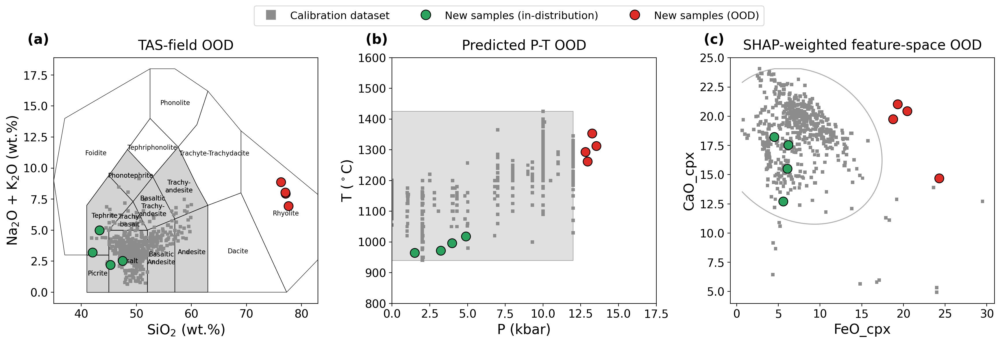

In [10]:
from paper.scripts.figure_helpers import (
    apply_figure_font_sizes,
    plot_ood_demo_figure__nb03_c15 as plot_ood_demo_figure,
    save_figure_pdf_png,
)

import matplotlib.pyplot as plt


fig, axes = plot_ood_demo_figure(
    P_model_dict,
    T_model_dict,
    cpx_unseen,
    liq_unseen,
)
apply_figure_font_sizes(fig, model_tick_labels=False)
save_figure_pdf_png(fig, IMAGES_DIR, "fig_3_ood_demo")
plt.show()

# SHAP figures

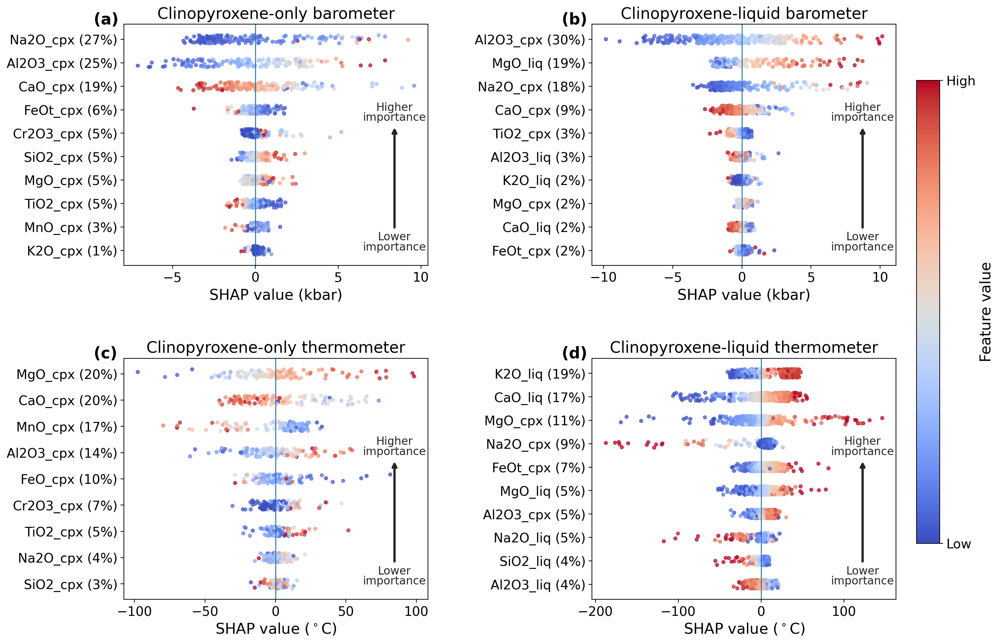

In [11]:
from aims4pt.model_tools.ModelManager import ModelManager
from aims4pt.visualization.mode_related_plot import plot_shap_summary_dot_colored
from paper.scripts.figure_helpers import (
    add_shared_feature_value_colorbar__nb03_c18 as add_shared_feature_value_colorbar,
    add_shap_importance_arrow__nb03_c18 as add_shap_importance_arrow,
    apply_figure_font_sizes,
    save_figure_pdf_png,
)

import matplotlib.pyplot as plt
import pandas as pd


def _concat_shap_features(model):
    """Return feature values aligned to the cached SHAP dataframe."""
    shap_df = model.shap_df
    sampled_idx = shap_df.index
    X_cpx = model.X_cpx_training.loc[sampled_idx]
    X_liq = getattr(model, "X_liq_training", None)
    if X_liq is None or X_liq.shape[1] == 0:
        return X_cpx
    return pd.concat([X_cpx, X_liq.loc[sampled_idx]], axis=1)


def _get_model_by_aliases(model_pool, aliases, *, T_P, cpx_only):
    """Return the first model matching one of several display-name aliases."""
    for alias in aliases:
        matched = ModelManager.filter_models(
            model_pool,
            model_name=alias,
            T_P=T_P,
            cpx_only=cpx_only,
            exact=False,
        )
        if matched:
            return ModelManager.get_model(matched, raise_if_empty=True)
    raise ValueError(f"No model matched aliases: {aliases}")


shap_example_models = [
    ("(a)", _get_model_by_aliases(P_model_pool, ["Petrelli"], T_P="P", cpx_only=True)),
    ("(b)", _get_model_by_aliases(P_model_pool, ["\u00c1greda-L\u00f3pez", "Agreda", "greda"], T_P="P", cpx_only=False)),
    ("(c)", _get_model_by_aliases(T_model_pool, ["Higgins"], T_P="T", cpx_only=True)),
    ("(d)", _get_model_by_aliases(T_model_pool, ["Chicchi"], T_P="T", cpx_only=False)),
]

fig, axes = plt.subplots(2, 2, figsize=(15, 9.6), dpi=200, constrained_layout=True)
fig.set_constrained_layout_pads(hspace=0.12, wspace=0.08)
axes[0, 0].set_title("Clinopyroxene-only barometer", fontsize=17)
axes[0, 1].set_title("Clinopyroxene-liquid barometer", fontsize=17)
axes[1, 0].set_title("Clinopyroxene-only thermometer", fontsize=17)
axes[1, 1].set_title("Clinopyroxene-liquid thermometer", fontsize=17)

for ax, (panel_label, model) in zip(axes.ravel(), shap_example_models):
    plot_shap_summary_dot_colored(
        model.shap_df,
        _concat_shap_features(model),
        top_n=10,
        ax=ax,
        cmap=plt.cm.coolwarm,
        if_show_colorbar=False,
        units="(kbar)" if model.T_P == "P" else r"($^\circ$C)",
    )
    add_shap_importance_arrow(ax, fontsize=12)
    ax.text(
        -0.10,
        1.05,
        panel_label,
        transform=ax.transAxes,
        ha="left",
        va="top",
        fontsize=17,
        fontweight="bold",
        clip_on=False,
    )

add_shared_feature_value_colorbar(fig, axes, labelsize=16, tick_labelsize=14)
apply_figure_font_sizes(
    fig,
    model_tick_labels=False,
    labelsize=16,
    ylabelsize=16,
    tick_labelsize=14,
    title_size=17,
    legend_font_size=14,
)
save_figure_pdf_png(fig, IMAGES_DIR, "fig_2_shap_examples")
plt.show()


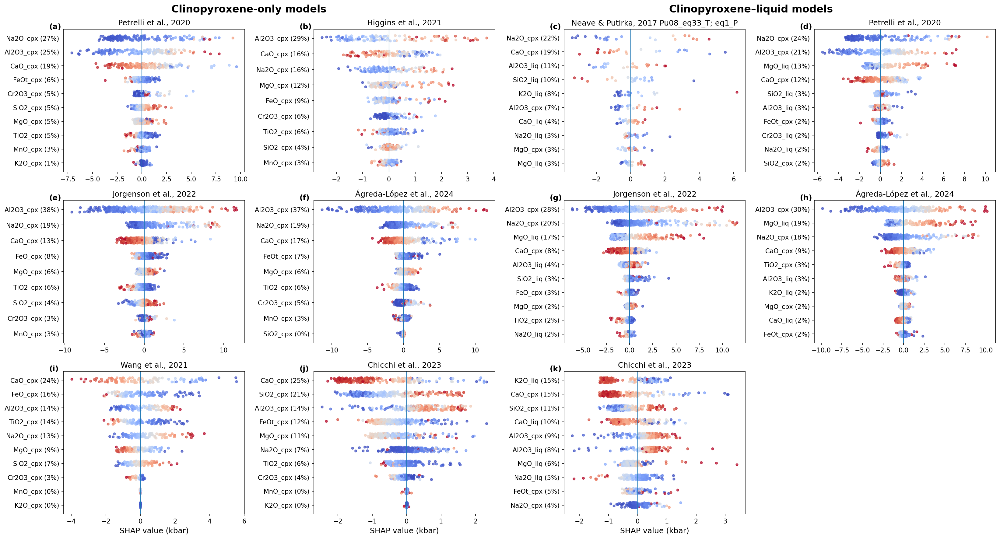

(WindowsPath('c:/Users/13493/Documents/PROJECTS/Cpx_thermobarometry_recommend_202507/code/AIMS4PT/paper/.images/fig_s1_shap_pressure_full.pdf'),
 WindowsPath('c:/Users/13493/Documents/PROJECTS/Cpx_thermobarometry_recommend_202507/code/AIMS4PT/paper/.images/fig_s1_shap_pressure_full.png'))

In [12]:
from paper.scripts.figure_helpers import (
    _add_panel_letter__nb03_c05 as _add_panel_letter,
    _clean_model_label__nb03_c05 as _clean_model_label,
    _format_panel_title__nb03_c05 as _format_panel_title,
    _safe_concat_cpx_liq__nb03_c05 as _safe_concat_cpx_liq,
    plot_shap_summary_cpx_only_vs_cpx_liq__nb03_c05 as plot_shap_summary_cpx_only_vs_cpx_liq,
    save_figure_pdf_png,
)

import math
import string
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import StratifiedShuffleSplit

from aims4pt.visualization.mode_related_plot import (
    plot_shap_summary_dot_colored,
)


# ============================================================
# Run & save
# ============================================================
P_model_has_data = [model for model in P_model_pool if getattr(model, "X_cpx_training", None) is not None]

fig, axes = plot_shap_summary_cpx_only_vs_cpx_liq(
    P_model_has_data,
    top_n=10,
    fig_width_per_col=5.5,
    row_height=4.0,
)
save_figure_pdf_png(fig, IMAGES_DIR, "fig_s1_shap_pressure_full")


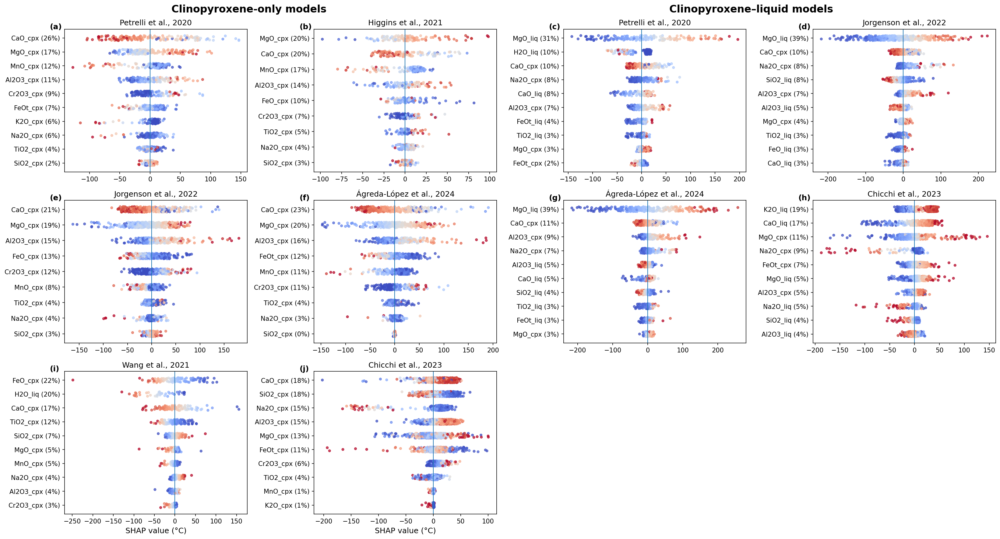

(WindowsPath('c:/Users/13493/Documents/PROJECTS/Cpx_thermobarometry_recommend_202507/code/AIMS4PT/paper/.images/fig_s2_shap_temperature_full.pdf'),
 WindowsPath('c:/Users/13493/Documents/PROJECTS/Cpx_thermobarometry_recommend_202507/code/AIMS4PT/paper/.images/fig_s2_shap_temperature_full.png'))

In [13]:
T_model_has_data = [model for model in T_model_pool if getattr(model, "X_cpx_training", None) is not None]

fig, axes = plot_shap_summary_cpx_only_vs_cpx_liq(
    T_model_has_data,
    top_n=10,
    fig_width_per_col=5.5,
    row_height=4.0,
)
save_figure_pdf_png(fig, IMAGES_DIR, "fig_s2_shap_temperature_full")


# OOD

## OOD vs deviation (pressure model)

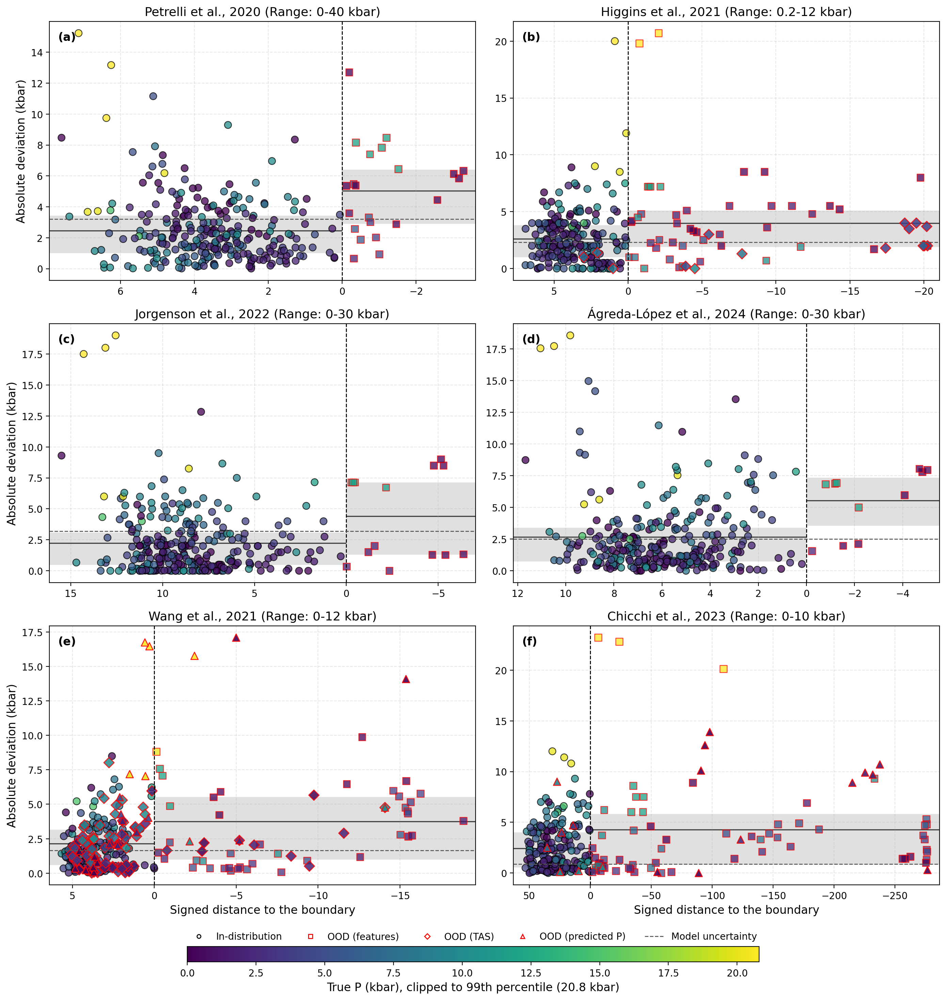

(WindowsPath('c:/Users/13493/Documents/PROJECTS/Cpx_thermobarometry_recommend_202507/code/AIMS4PT/paper/.images/fig_s_ood_P_cpx_only.pdf'),
 WindowsPath('c:/Users/13493/Documents/PROJECTS/Cpx_thermobarometry_recommend_202507/code/AIMS4PT/paper/.images/fig_s_ood_P_cpx_only.png'))

In [14]:
from paper.scripts.figure_helpers import (
    _add_panel_labels__nb03_c08 as _add_panel_labels,
    _draw_side_q1_mean_q3__nb03_c08 as _draw_side_q1_mean_q3,
    _fmt_num__nb03_c08 as _fmt_num,
    plot_ood_panels_generic__nb03_c08 as plot_ood_panels_generic,
    plot_ood_score_vs_deviation__nb03_c08 as plot_ood_score_vs_deviation,
    save_figure_pdf_png,
)



test_cpx = cpx_unseen.copy()
test_liq = liq_unseen.copy()
test_meta = meta_unseen.copy()
test_meta.rename(columns={P_col: "P_kbar", T_col: "T_C"}, inplace=True)

P_cpx_only = [
    m for m in P_model_pool
    if m.cpx_only and getattr(m, "X_cpx_training", None) is not None
]
fig, axes = plot_ood_panels_generic(
    P_cpx_only,
    test_cpx,
    test_meta,
    test_liq=test_liq,
    petrological_ood_marker=True,
    T_P_ood_marker=True,
    ncols=2,
    fig_width=14,
    row_height=5.4,
    height_scale=1.08,
    cmap_name="viridis",
    norm_min=0,
    clip_to_p99=True,    
    cbar_width=0.6,
    cbar_height=0.013,
    cbar_y=0.15,
    legend_anchor_y=0.16,
    tight_bottom=0.18,
    tight_top=0.96,
)
plt.show()
save_figure_pdf_png(fig, IMAGES_DIR, "fig_s_ood_P_cpx_only")


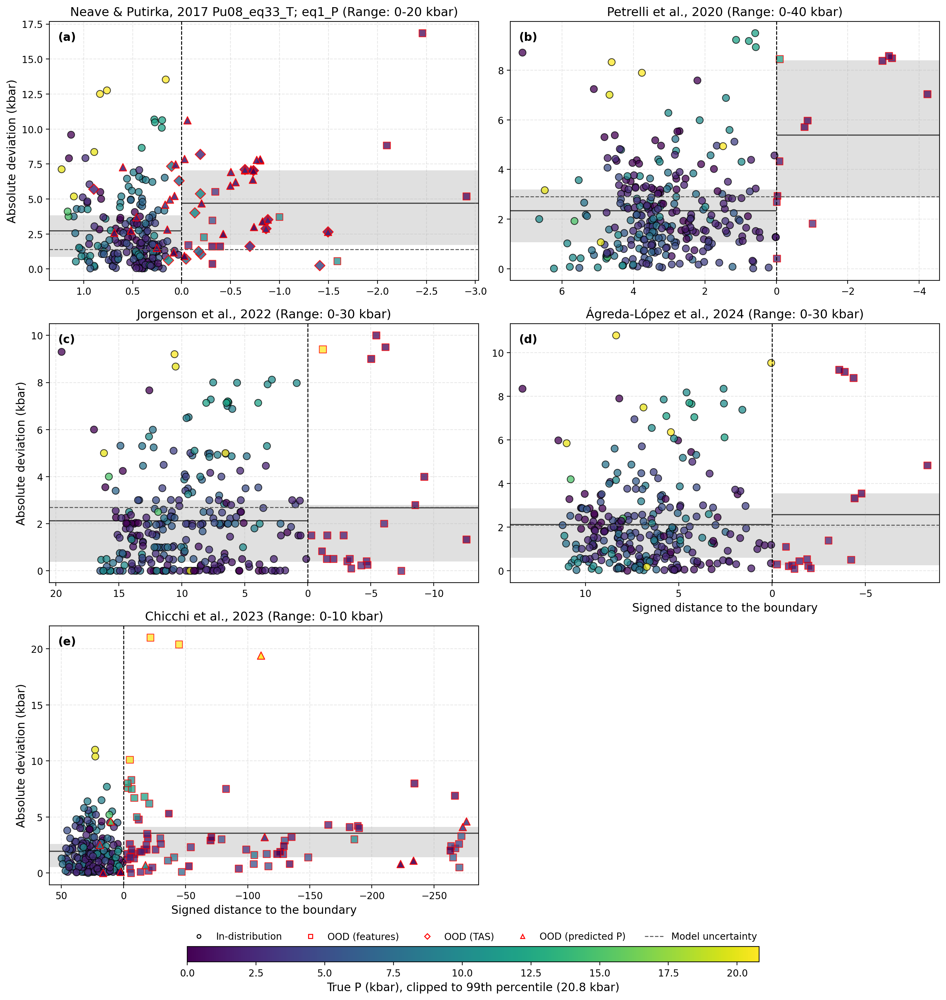

(WindowsPath('c:/Users/13493/Documents/PROJECTS/Cpx_thermobarometry_recommend_202507/code/AIMS4PT/paper/.images/fig_s_ood_P_cpx_liq.pdf'),
 WindowsPath('c:/Users/13493/Documents/PROJECTS/Cpx_thermobarometry_recommend_202507/code/AIMS4PT/paper/.images/fig_s_ood_P_cpx_liq.png'))

In [15]:
P_cpx_liq = [
    m for m in P_model_pool
    if not m.cpx_only
]
fig, axes = plot_ood_panels_generic(
    P_cpx_liq,
    test_cpx,
    test_meta,
    test_liq=test_liq,
    petrological_ood_marker=True,
    T_P_ood_marker=True,
    ncols=2,
    fig_width=14,
    row_height=5.4,
    height_scale=1.08,
    cmap_name="viridis",
    norm_min=0,
    clip_to_p99=True,    
    cbar_width=0.6,
    cbar_height=0.013,
    cbar_y=0.15,
    legend_anchor_y=0.16,
    tight_bottom=0.18,
    tight_top=0.96,
)
plt.show()
save_figure_pdf_png(fig, IMAGES_DIR, "fig_s_ood_P_cpx_liq")


## OOD vs deviation (temperature model)

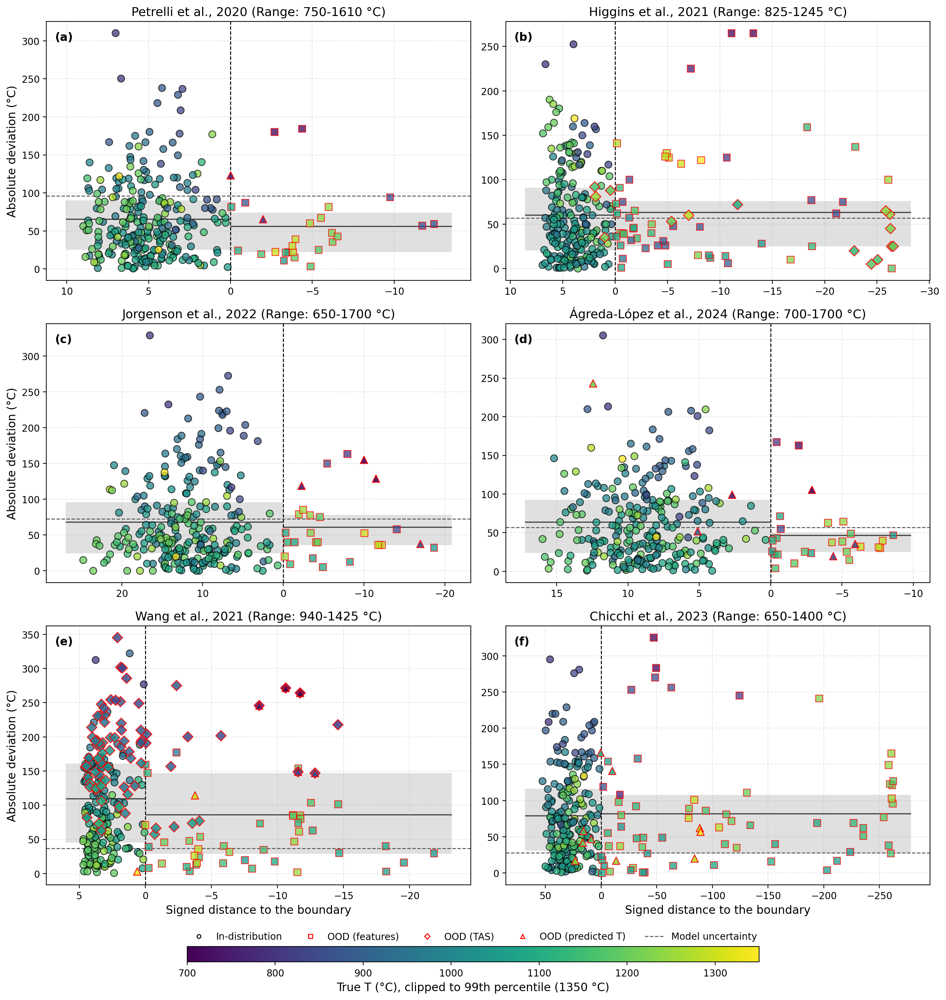

(WindowsPath('c:/Users/13493/Documents/PROJECTS/Cpx_thermobarometry_recommend_202507/code/AIMS4PT/paper/.images/fig_s_ood_T_cpx_only.pdf'),
 WindowsPath('c:/Users/13493/Documents/PROJECTS/Cpx_thermobarometry_recommend_202507/code/AIMS4PT/paper/.images/fig_s_ood_T_cpx_only.png'))

In [16]:

from paper.scripts.figure_helpers import (
    plot_ood_panels_generic__nb03_c12 as plot_ood_panels_generic,
    plot_ood_score_vs_deviation__nb03_c12 as plot_ood_score_vs_deviation,
)

# =========================
# Calling (Temperature version)
# =========================
test_cpx = cpx_unseen.copy()
test_liq = liq_unseen.copy()
test_meta = meta_unseen.copy()
test_meta.rename(columns={P_col: "P_kbar", T_col: "T_C"}, inplace=True)

T_cpx_only = [
    m for m in T_model_pool
    if m.cpx_only and getattr(m, "X_cpx_training", None) is not None
]

fig, axes = plot_ood_panels_generic(
    T_cpx_only,
    test_cpx,
    test_meta,
    test_liq=test_liq,
    petrological_ood_marker=True,
    T_P_ood_marker=True,
    ncols=2,
    fig_width=14,
    row_height=5.4,
    height_scale=1.08,
    cmap_name="viridis",
    norm_min=700,          # typical temperature range start
    clip_to_p99=False,
    cbar_width=0.6,
    cbar_height=0.013,
    cbar_y=0.15,
    legend_anchor_y=0.16,
    tight_bottom=0.18,
    tight_top=0.96,
)
plt.show()
save_figure_pdf_png(fig, IMAGES_DIR, "fig_s_ood_T_cpx_only")


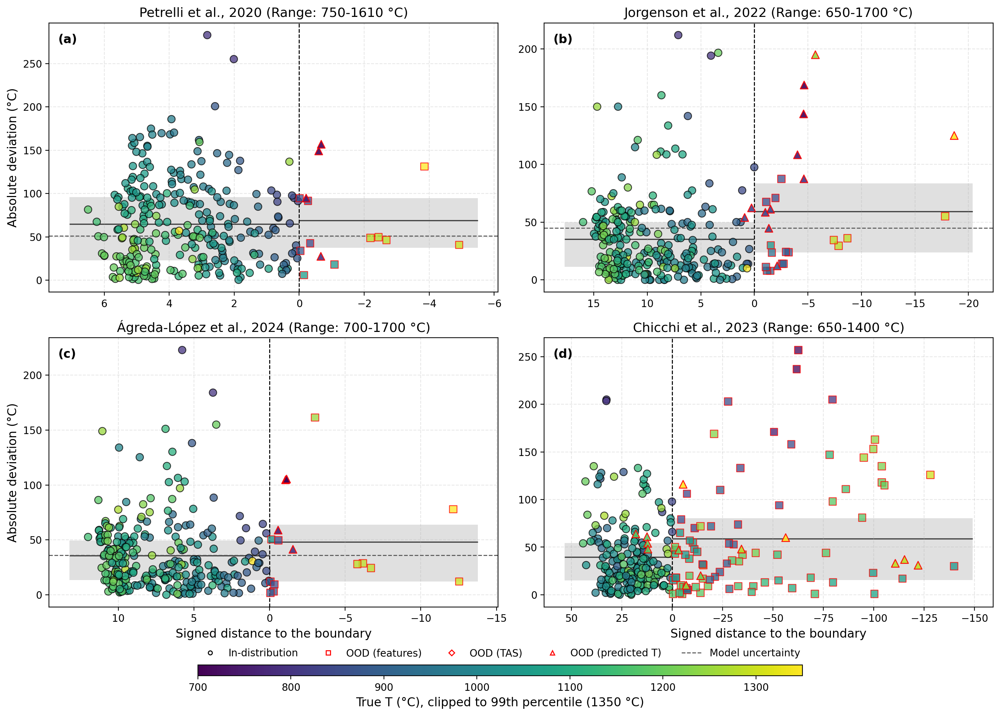

(WindowsPath('c:/Users/13493/Documents/PROJECTS/Cpx_thermobarometry_recommend_202507/code/AIMS4PT/paper/.images/fig_s_ood_T_cpx_liq.pdf'),
 WindowsPath('c:/Users/13493/Documents/PROJECTS/Cpx_thermobarometry_recommend_202507/code/AIMS4PT/paper/.images/fig_s_ood_T_cpx_liq.png'))

In [17]:
T_cpx_liq = [
    m for m in T_model_pool
    if not m.cpx_only
]


fig, axes = plot_ood_panels_generic(
    T_cpx_liq,
    test_cpx,
    test_meta,
    test_liq=test_liq,
    petrological_ood_marker=True,
    T_P_ood_marker=True,
    ncols=2,
    fig_width=14,
    row_height=5.4,
    height_scale=1.08,
    cmap_name="viridis",
    norm_min=700,          # typical temperature range start
    clip_to_p99=False,
    cbar_width=0.6,
    cbar_height=0.013,
    cbar_y=0.15,
    legend_anchor_y=0.16,
    tight_bottom=0.18,
    tight_top=0.96,
)
plt.show()
save_figure_pdf_png(fig, IMAGES_DIR, "fig_s_ood_T_cpx_liq")


## TAS ood 

c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
Error importing in API mode: ImportError('On Windows, cffi mode "ANY" is only "ABI".')
Trying to import in ABI mode.
R callback write-console: Loading required package: rJava
  
R callback write-console: Loading required package: extraTrees
  
R callback write-console: Loading required package: EnvStats
  
R callback write-console: 
Attaching package: 'EnvStats'

  
R callback write-console: The following objects are masked from 'package:stats':

    predict, predict.lm

  
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\13493\miniconda3\envs\AIMS4PT\lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  re

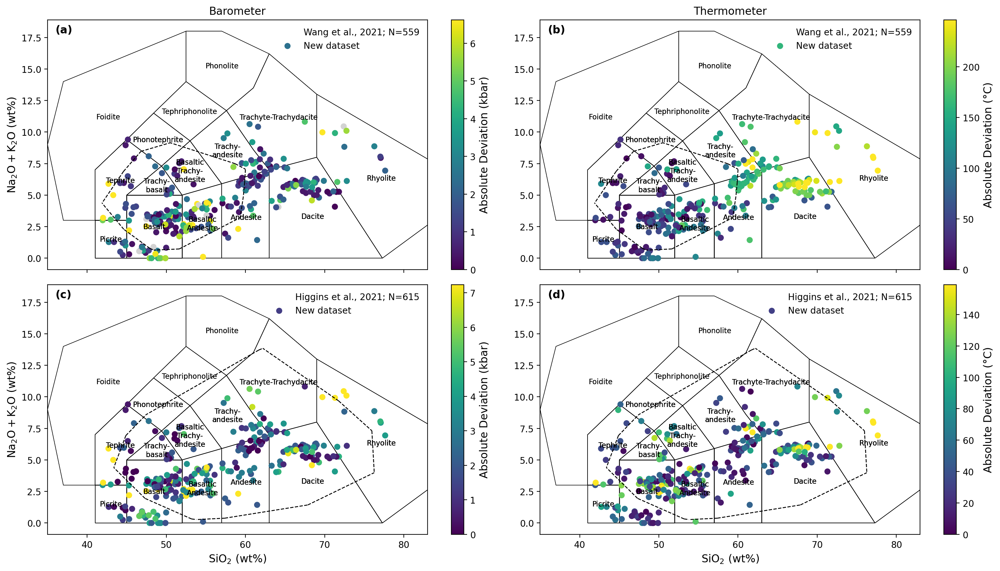

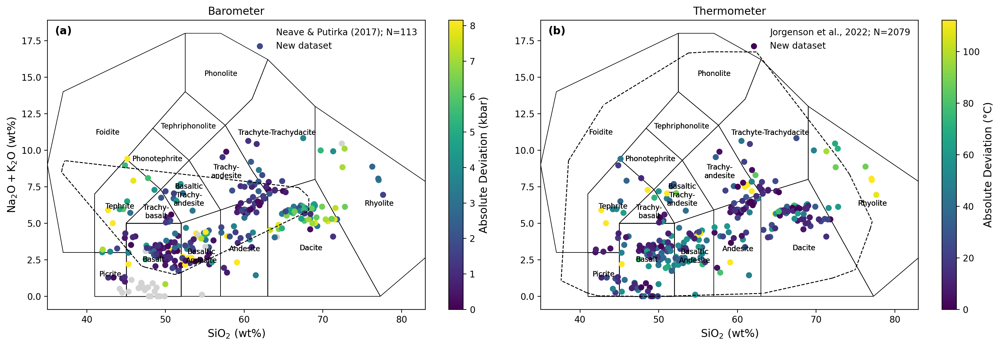

(WindowsPath('c:/Users/13493/Documents/PROJECTS/Cpx_thermobarometry_recommend_202507/code/AIMS4PT/paper/.images/fig_s_tas_ood_cpx_liq.pdf'),
 WindowsPath('c:/Users/13493/Documents/PROJECTS/Cpx_thermobarometry_recommend_202507/code/AIMS4PT/paper/.images/fig_s_tas_ood_cpx_liq.png'))

In [18]:
from paper.scripts.figure_helpers import (
    _add_panel_labels__nb03_c16 as _add_panel_labels,
    _clean_model_label_keep_year__nb03_c16 as _clean_model_label_keep_year,
    plot_tas_with_deviation_cbar__nb03_c16 as plot_tas_with_deviation_cbar,
    save_figure_pdf_png,
)

import numpy as np
import matplotlib.pyplot as plt


from aims4pt.visualization.composition_plot import plot_glass_TAS_diagram



# ---- Pressure models
Wang_col_P = "Wang et al., 2021 (cpx_only)"
Higgins_col_P = "Higgins et al., 2021 (cpx_only)"
Neave_col_P = "Neave & Putirka, 2017 Pu08_eq33_T; eq1_P (cpx_liq) (cpx_liq)"

Wang_model_P = P_model_dict[Wang_col_P]
Higgins_model_P = P_model_dict[Higgins_col_P]
Neave_model_P = P_model_dict[Neave_col_P]

Wang_dev_P = np.abs(Wang_model_P.predict(cpx_unseen, liq_unseen) - meta_unseen[P_col])
Higgins_dev_P = np.abs(Higgins_model_P.predict(cpx_unseen) - meta_unseen[P_col])
Neave_dev_P = np.abs(Neave_model_P.predict(cpx_unseen, liq_unseen) - meta_unseen[P_col])

# ---- Temperature models
Wang_col_T = "Wang et al., 2021 (cpx_only)"
Higgins_col_T = "Higgins et al., 2021 (cpx_only)"
Jorgenson_col_T = "Jorgenson et al., 2022 (cpx_liq)"

Wang_model_T = T_model_dict[Wang_col_T]
Higgins_model_T = T_model_dict[Higgins_col_T]
Jorgenson_model_T = T_model_dict[Jorgenson_col_T]

Wang_dev_T = np.abs(Wang_model_T.predict(cpx_unseen, liq_unseen) - meta_unseen[T_col])
Higgins_dev_T = np.abs(Higgins_model_T.predict(cpx_unseen, liq_unseen) - meta_unseen[T_col])
Jorgenson_dev_T = np.abs(Jorgenson_model_T.predict(cpx_unseen, liq_unseen) - meta_unseen[T_col])


# ============================================================
# Figure 1: 2x2 (wider)
#   [0,0] Wang P | [0,1] Wang T
#   [1,0] Higgins P | [1,1] Higgins T
# ============================================================

fig1, axes1 = plt.subplots(2, 2, figsize=(16, 9), dpi=200)  # ✅ wider

# ---- first row titles
axes1[0, 0].set_title("Barometer")
axes1[0, 1].set_title("Thermometer")

plot_tas_with_deviation_cbar(
    fig=fig1, ax=axes1[0, 0],
    model=Wang_model_P, model_label=Wang_col_P,
    X_liq_test=liq_unseen, deviation=Wang_dev_P,
    q=0.95, draw_convex_hull=True,
    colorbar_label="Absolute Deviation (kbar)",
)

plot_tas_with_deviation_cbar(
    fig=fig1, ax=axes1[0, 1],
    model=Wang_model_T, model_label=Wang_col_T,
    X_liq_test=liq_unseen, deviation=Wang_dev_T,
    q=0.95, draw_convex_hull=True,
    colorbar_label="Absolute Deviation (°C)",
)

plot_tas_with_deviation_cbar(
    fig=fig1, ax=axes1[1, 0],
    model=Higgins_model_P, model_label=Higgins_col_P,
    X_liq_test=liq_unseen, deviation=Higgins_dev_P,
    q=0.95, draw_convex_hull=True,
    colorbar_label="Absolute Deviation (kbar)",
)

plot_tas_with_deviation_cbar(
    fig=fig1, ax=axes1[1, 1],
    model=Higgins_model_T, model_label=Higgins_col_T,
    X_liq_test=liq_unseen, deviation=Higgins_dev_T,
    q=0.95, draw_convex_hull=True,
    colorbar_label="Absolute Deviation (°C)",
)

# ---- (3) remove y-axis label on right column
for ax in (axes1[0, 1], axes1[1, 1]):
    ax.set_ylabel("")

# ---- (4) keep x-axis labels only on last row
for ax in (axes1[0, 0], axes1[0, 1]):
    ax.set_xlabel("")
    ax.tick_params(labelbottom=False)

# ---- add panel labels (a)-(d)
_add_panel_labels(axes1, ["(a)", "(b)", "(c)", "(d)"])

fig1.tight_layout()
plt.show()
# save
save_figure_pdf_png(fig1, IMAGES_DIR, "fig_s_tas_ood_cpx_only")

# ============================================================
# Figure 2: 1x2 (wider)
#   left: Neave P | right: Jorgenson T
# ============================================================

fig2, axes2 = plt.subplots(1, 2, figsize=(16, 5.5), dpi=200)  # ✅ wider
axes2[0].set_title("Barometer")
axes2[1].set_title("Thermometer")

plot_tas_with_deviation_cbar(
    fig=fig2, ax=axes2[0],
    model=Neave_model_P, model_label=Neave_col_P,   # ✅ label cleaned inside func
    X_liq_test=liq_unseen, deviation=Neave_dev_P,
    q=0.95, draw_convex_hull=True,
    colorbar_label="Absolute Deviation (kbar)",
)

plot_tas_with_deviation_cbar(
    fig=fig2, ax=axes2[1],
    model=Jorgenson_model_T, model_label=Jorgenson_col_T,
    X_liq_test=liq_unseen, deviation=Jorgenson_dev_T,
    q=0.95, draw_convex_hull=True,
    colorbar_label="Absolute Deviation (°C)",
)

# ---- (3) remove y-axis label on right panel
axes2[1].set_ylabel("")

# ---- add panel labels (a)-(b) for figure 2
_add_panel_labels(axes2, ["(a)", "(b)"])

fig2.tight_layout()
plt.show()
save_figure_pdf_png(fig2, IMAGES_DIR, "fig_s_tas_ood_cpx_liq")


# AIMS4PT_cpx results

## Pressure model

In [19]:
from aims4pt.model_tools.CpxTBSelect import workflow_thermobarometry
test_cpx = cpx_unseen.loc[testing_unseen_id].copy()
test_liq = liq_unseen.loc[testing_unseen_id].copy()
test_meta = meta_unseen.loc[testing_unseen_id].copy()
test_meta.rename(columns={P_col: "P_kbar", T_col: "T_C"}, inplace=True)

P_cpx_only_pool = [model for model in P_model_pool if model.cpx_only]
P_cpx_liq_pool = [model for model in P_model_pool if not model.cpx_only]
len_only, len_liq = len(P_cpx_only_pool), len(P_cpx_liq_pool)

df_path = CACHE_DIR / "predicted_P_unseen_testing_set.csv"

if df_path.exists():
    predicted_P_df = pd.read_csv(df_path, index_col=0)
else:
    workflow_P_only_model = workflow_thermobarometry(P_cpx_only_pool)
    workflow_P_only = workflow_P_only_model.predict(test_cpx, test_liq)

    workflow_P_liq_model = workflow_thermobarometry(P_cpx_liq_pool)
    workflow_P_liq = workflow_P_liq_model.predict(test_cpx, test_liq)


    P_model_selection_only = workflow_P_only_model.get_best_model_series()
    P_model_selection_liq = workflow_P_liq_model.get_best_model_series()
    predicted_P_df = pd.DataFrame({ 
        "workflow_P_cpx_only": workflow_P_only,
        "best_model_P_cpx_only": P_model_selection_only,
        "workflow_P_cpx_liq": workflow_P_liq,
        "best_model_P_cpx_liq": P_model_selection_liq,
    })
    for model_name in  P_model_names:
        model = next((m for m in P_model_pool if m.model_name == model_name), None)
        if model is None:
            continue
        y_pred = model.predict(test_cpx, test_liq)
        predicted_P_df[model_name] = y_pred

    # store predicted P dataframe
    predicted_P_df.to_csv(df_path, index=True)

P_real = test_meta["P_kbar"].copy()

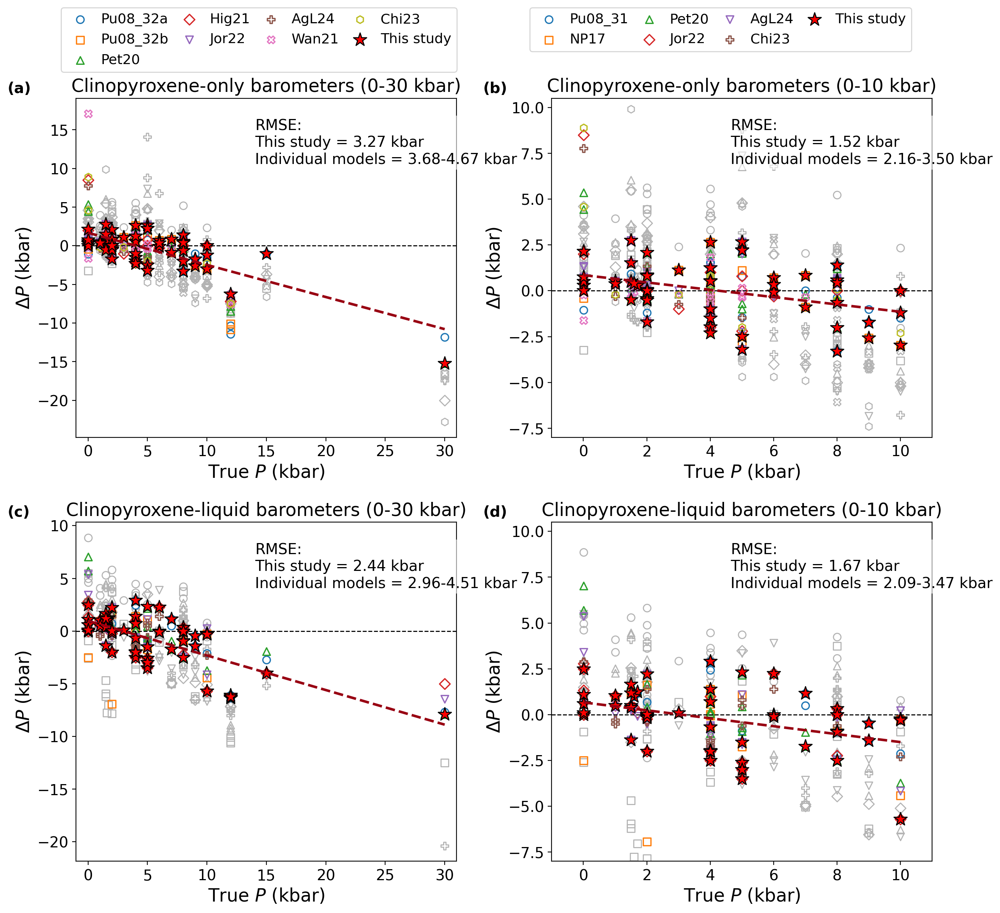

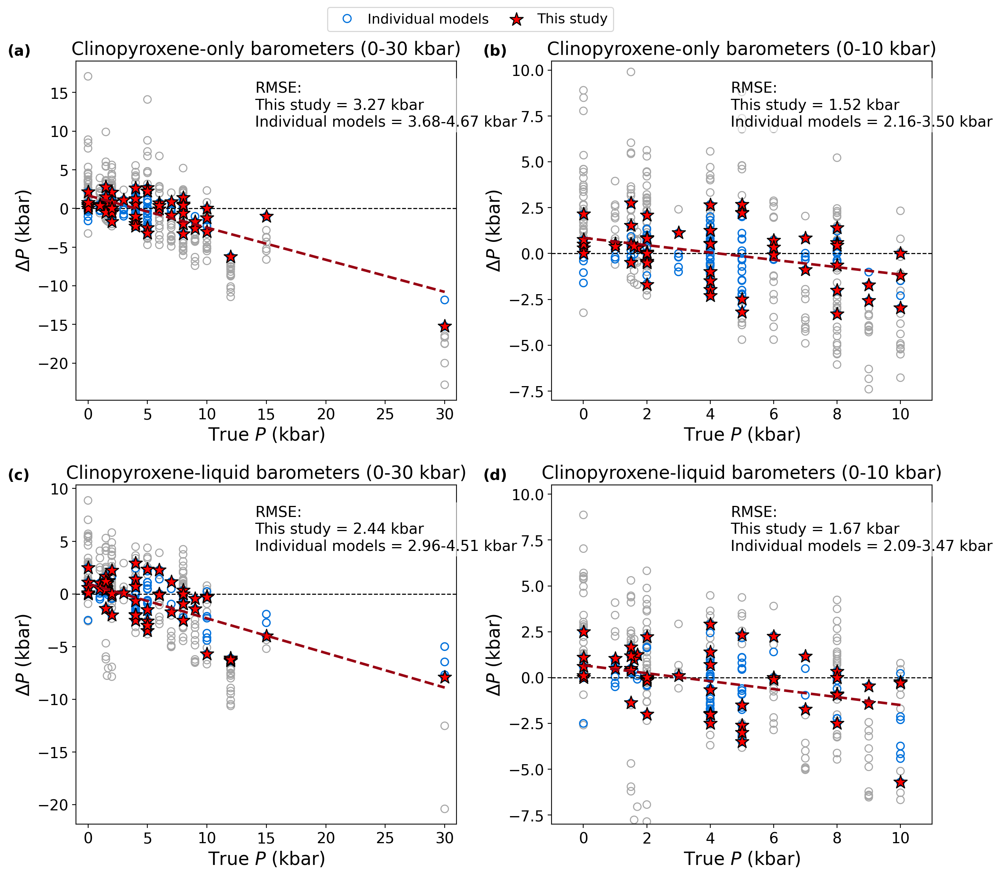

In [20]:
from aims4pt.model_tools.ModelManager import ModelManager
from paper.scripts.figure_helpers import (
    _add_panel_label__nb03_c20 as _add_panel_label,
    _dedupe_handles_labels__nb03_c20 as _dedupe_handles_labels,
    apply_figure_font_sizes,
    model_abbreviation_labels,
    plot_pressure_residual_panel__nb03_c20 as plot_pressure_residual_panel,
    save_figure_pdf_png,
)

import matplotlib.pyplot as plt


P_cpx_only_pool = ModelManager.filter_models(P_model_pool, T_P="P", cpx_only=True)
P_cpx_only_cols = [m.model_name for m in P_cpx_only_pool]
P_cpx_only_labels = model_abbreviation_labels(P_cpx_only_cols, "P")

P_cpx_liq_pool = ModelManager.filter_models(P_model_pool, T_P="P", cpx_only=False)
P_cpx_liq_cols = [m.model_name for m in P_cpx_liq_pool]
P_cpx_liq_labels = model_abbreviation_labels(P_cpx_liq_cols, "P")


def _draw_pressure_results_figure(individual_style):
    fig, axes = plt.subplots(2, 2, figsize=(12.6, 12.2), dpi=200, constrained_layout=False)

    axes[0, 0], (h00, l00) = plot_pressure_residual_panel(
        P_real, predicted_P_df,
        model_cols=P_cpx_only_cols,
        model_labels=P_cpx_only_labels,
        workflow_col="workflow_P_cpx_only",
        P_min=0, P_max=30,
        ax=axes[0, 0],
        title="Clinopyroxene-only barometers (0-30 kbar)",
        workflow_rmse_override=3.27,
        individual_style=individual_style,
    )

    axes[0, 1], (h01, l01) = plot_pressure_residual_panel(
        P_real, predicted_P_df,
        model_cols=P_cpx_only_cols,
        model_labels=P_cpx_only_labels,
        workflow_col="workflow_P_cpx_only",
        P_min=0, P_max=10,
        ax=axes[0, 1],
        title="Clinopyroxene-only barometers (0-10 kbar)",
        y_lim=(-8, 10.5),
        workflow_rmse_override=1.52,
        individual_style=individual_style,
    )

    h0, l0 = _dedupe_handles_labels(h00 + h01, l00 + l01)

    axes[1, 0], (h10, l10) = plot_pressure_residual_panel(
        P_real, predicted_P_df,
        model_cols=P_cpx_liq_cols,
        model_labels=P_cpx_liq_labels,
        workflow_col="workflow_P_cpx_liq",
        P_min=0, P_max=30,
        ax=axes[1, 0],
        title="Clinopyroxene-liquid barometers (0-30 kbar)",
        workflow_rmse_override=2.44,
        individual_style=individual_style,
    )

    axes[1, 1], (h11, l11) = plot_pressure_residual_panel(
        P_real, predicted_P_df,
        model_cols=P_cpx_liq_cols,
        model_labels=P_cpx_liq_labels,
        workflow_col="workflow_P_cpx_liq",
        P_min=0, P_max=10,
        ax=axes[1, 1],
        title="Clinopyroxene-liquid barometers (0-10 kbar)",
        y_lim=(-8, 10.5),
        workflow_rmse_override=1.67,
        individual_style=individual_style,
    )

    h1, l1 = _dedupe_handles_labels(h10 + h11, l10 + l11)

    for ax, label in zip(axes.ravel(), ["(a)", "(b)", "(c)", "(d)"]):
        _add_panel_label(ax, label, x=-0.18, y=1.05)

    fig.subplots_adjust(left=0.09, right=0.98, bottom=0.06, top=0.88, wspace=0.25, hspace=0.25)
    if individual_style == "gray_background":
        h_all, l_all = _dedupe_handles_labels(h0 + h1, l0 + l1)
        fig.legend(h_all, l_all, loc="upper center", bbox_to_anchor=(0.5, 0.945), ncol=2, frameon=True, fontsize=13, handletextpad=0.5, columnspacing=1.0)
    else:
        fig.legend(h0, l0, loc="upper center", bbox_to_anchor=(0.28, 0.985), ncol=4, frameon=True, fontsize=13, handletextpad=0.5, columnspacing=0.5)
        fig.legend(h1, l1, loc="upper center", bbox_to_anchor=(0.76, 0.985), ncol=4, frameon=True, fontsize=13, handletextpad=0.5, columnspacing=0.5)
    apply_figure_font_sizes(fig)
    return fig, axes


fig5_a, axes5_a = _draw_pressure_results_figure("version_a")
# save_figure_pdf_png(fig5_a, IMAGES_DIR, "fig_5_P_results")
save_figure_pdf_png(fig5_a, IMAGES_DIR, "fig_5_P_results_version_A")
plt.show()

fig5_b, axes5_b = _draw_pressure_results_figure("gray_background")
save_figure_pdf_png(fig5_b, IMAGES_DIR, "fig_5_P_results_version_B")
plt.show()

## Temperature model

In [21]:

df_path = CACHE_DIR / "predicted_T_unseen_testing_set.csv"
test_cpx = cpx_unseen.loc[testing_unseen_id].copy()
test_liq = liq_unseen.loc[testing_unseen_id].copy()
test_meta = meta_unseen.loc[testing_unseen_id].copy()
test_meta.rename(columns={P_col: "P_kbar", T_col: "T_C"}, inplace=True)

T_cpx_only_pool = [model for model in T_model_pool if model.cpx_only]
T_cpx_liq_pool = [model for model in T_model_pool if not model.cpx_only]
len_only, len_liq = len(T_cpx_only_pool), len(T_cpx_liq_pool)

if df_path.exists():
    predicted_T_df = pd.read_csv(df_path, index_col=0)
else:
    workflow_T_only_model = workflow_thermobarometry(T_cpx_only_pool)
    workflow_T_only = workflow_T_only_model.predict(test_cpx, test_liq)

    T_model_selection_only = workflow_T_only_model.get_best_model_series()
    workflow_T_liq_model = workflow_thermobarometry(T_cpx_liq_pool)
    workflow_T_liq = workflow_T_liq_model.predict(test_cpx, test_liq)
    T_model_selection_liq = workflow_T_liq_model.get_best_model_series()
    predicted_T_df = pd.DataFrame({ 
        "workflow_T_cpx_only": workflow_T_only,
        "best_model_T_cpx_only": T_model_selection_only,
        "workflow_T_cpx_liq": workflow_T_liq,
        "best_model_T_cpx_liq": T_model_selection_liq,
    })

    for model_name in T_model_names:
        model = next((m for m in T_model_pool if m.model_name == model_name), None)
        if model is None:
            continue
        y_pred = model.predict(test_cpx, test_liq)
        predicted_T_df[model_name] = y_pred


    predicted_T_df.to_csv(df_path)
T_real = test_meta["T_C"].copy()

## Most frequently selected AIMS4PT_cpx models

In [22]:
model_selection_groups = [
    ("P", "cpx_only", "Pressure, clinopyroxene-only", predicted_P_df, "best_model_P_cpx_only"),
    ("P", "cpx_liq", "Pressure, clinopyroxene-liquid", predicted_P_df, "best_model_P_cpx_liq"),
    ("T", "cpx_only", "Temperature, clinopyroxene-only", predicted_T_df, "best_model_T_cpx_only"),
    ("T", "cpx_liq", "Temperature, clinopyroxene-liquid", predicted_T_df, "best_model_T_cpx_liq"),
]

selection_count_rows = []
top_selection_rows = []
for variable, phase_type, calculation, df_pred, best_model_col in model_selection_groups:
    if best_model_col not in df_pred.columns:
        raise KeyError(f"Missing required best-model column: {best_model_col}")

    counts = df_pred[best_model_col].dropna().astype(str).value_counts()
    total_selected_samples = int(counts.sum())

    for rank, (model_name, selected_count) in enumerate(counts.items(), start=1):
        selected_fraction = selected_count / total_selected_samples if total_selected_samples else pd.NA
        selection_count_rows.append(
            {
                "variable": variable,
                "phase_type": phase_type,
                "calculation": calculation,
                "rank": rank,
                "model": model_name,
                "selected_count": int(selected_count),
                "selected_fraction": selected_fraction,
                "total_selected_samples": total_selected_samples,
            }
        )

    if not counts.empty:
        top_model = counts.index[0]
        top_count = int(counts.iloc[0])
        top_selection_rows.append(
            {
                "variable": variable,
                "phase_type": phase_type,
                "calculation": calculation,
                "most_selected_model": top_model,
                "selected_count": top_count,
                "selected_fraction": top_count / total_selected_samples,
                "total_selected_samples": total_selected_samples,
            }
        )

top_selected_models = pd.DataFrame(top_selection_rows)
model_selection_count_summary = pd.DataFrame(selection_count_rows)

display(top_selected_models)
display(model_selection_count_summary)


,variable,phase_type,calculation,most_selected_model,selected_count,selected_fraction,total_selected_samples
0,P,cpx_only,"Pressure, clinopyroxene-only","Jorgenson et al., 2022 (cpx_only)",16,0.290909,55
1,P,cpx_liq,"Pressure, clinopyroxene-liquid","Jorgenson et al., 2022 (cpx_liq)",21,0.375000,56
2,T,cpx_only,"Temperature, clinopyroxene-only","Higgins et al., 2021 (cpx_only)",21,0.381818,55
3,T,cpx_liq,"Temperature, clinopyroxene-liquid","Jorgenson et al., 2022 (cpx_liq)",17,0.298246,57


,variable,phase_type,calculation,rank,model,selected_count,selected_fraction,total_selected_samples
0,P,cpx_only,"Pressure, clinopyroxene-only",1,"Jorgenson et al., 2022 (cpx_only)",16,0.290909,55
1,P,cpx_only,"Pressure, clinopyroxene-only",2,"Putirka, 2008 eq32d_T; eq32b_P (cpx_only)",10,0.181818,55
2,P,cpx_only,"Pressure, clinopyroxene-only",3,"Putirka, 2008 eq32d_T; eq32a_P (cpx_only)",8,0.145455,55
3,P,cpx_only,"Pressure, clinopyroxene-only",4,"Higgins et al., 2021 (cpx_only)",6,0.109091,55
4,P,cpx_only,"Pressure, clinopyroxene-only",5,"Petrelli et al., 2020 (cpx_only)",5,0.090909,55
5,P,cpx_only,"Pressure, clinopyroxene-only",6,"Ágreda-López et al., 2024 (cpx_only)",4,0.072727,55
6,P,cpx_only,"Pressure, clinopyroxene-only",7,"Chicchi et al., 2023 (cpx_only)",3,0.054545,55
7,P,cpx_only,"Pressure, clinopyroxene-only",8,"Wang et al., 2021 (cpx_only)",3,0.054545,55
8,P,cpx_liq,"Pressure, clinopyroxene-liquid",1,"Jorgenson et al., 2022 (cpx_liq)",21,0.375000,56
9,P,cpx_liq,"Pressure, clinopyroxene-liquid",2,"Putirka, 2008 eq33_T; eq31_P (cpx_liq)",9,0.160714,56


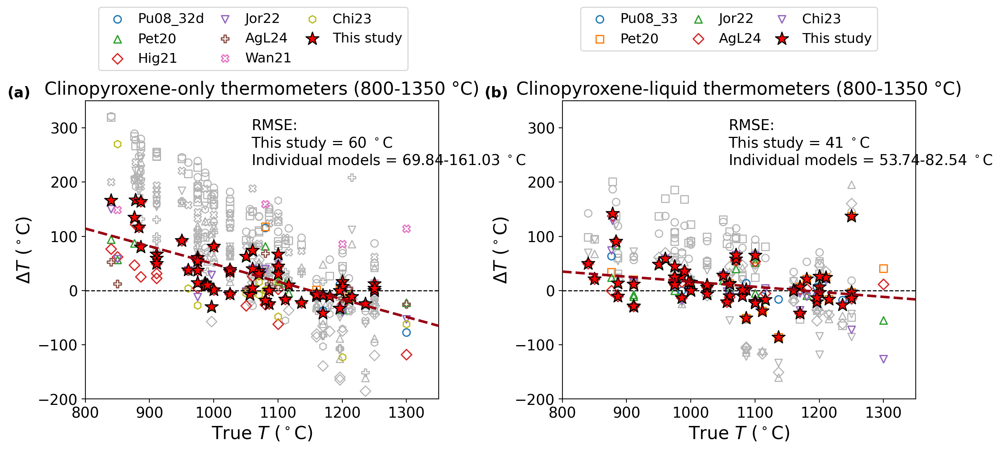

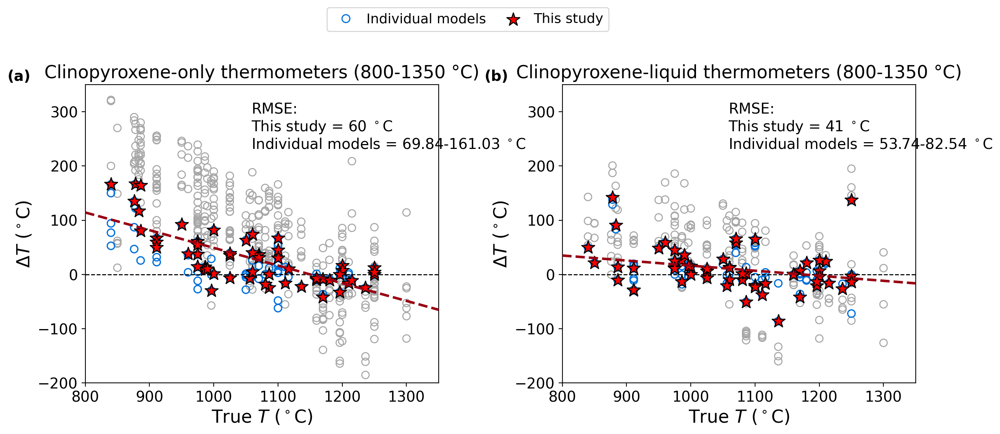

In [23]:
from aims4pt.model_tools.ModelManager import ModelManager
from paper.scripts.figure_helpers import (
    _add_panel_label__nb03_c23 as _add_panel_label,
    _dedupe_handles_labels__nb03_c23 as _dedupe_handles_labels,
    apply_figure_font_sizes,
    model_abbreviation_labels,
    plot_temperature_residual_panel__nb03_c23 as plot_temperature_residual_panel,
    save_figure_pdf_png,
)

import matplotlib.pyplot as plt


T_cpx_only_pool = ModelManager.filter_models(T_model_pool, T_P="T", cpx_only=True)
T_cpx_only_cols = [m.model_name for m in T_cpx_only_pool]
T_cpx_only_labels = model_abbreviation_labels(T_cpx_only_cols, "T")

T_cpx_liq_pool = ModelManager.filter_models(T_model_pool, T_P="T", cpx_only=False)
T_cpx_liq_cols = [m.model_name for m in T_cpx_liq_pool]
T_cpx_liq_labels = model_abbreviation_labels(T_cpx_liq_cols, "T")


def _draw_temperature_results_figure(individual_style):
    fig, axes = plt.subplots(1, 2, figsize=(12.4, 6.2), dpi=200, constrained_layout=False)

    axes[0], (h0, l0) = plot_temperature_residual_panel(
        T_real, predicted_T_df,
        model_cols=T_cpx_only_cols,
        model_labels=T_cpx_only_labels,
        workflow_col="workflow_T_cpx_only",
        T_min=800, T_max=1350,
        ax=axes[0],
        title="Clinopyroxene-only thermometers (800-1350 °C)",
        y_lim=(-200, 350),
        workflow_rmse_override=60,
        individual_style=individual_style,
    )

    axes[1], (h1, l1) = plot_temperature_residual_panel(
        T_real, predicted_T_df,
        model_cols=T_cpx_liq_cols,
        model_labels=T_cpx_liq_labels,
        workflow_col="workflow_T_cpx_liq",
        T_min=800, T_max=1350,
        ax=axes[1],
        title="Clinopyroxene-liquid thermometers (800-1350 °C)",
        y_lim=(-200, 350),
        workflow_rmse_override=41,
        individual_style=individual_style,
    )

    h0, l0 = _dedupe_handles_labels(h0, l0)
    h1, l1 = _dedupe_handles_labels(h1, l1)

    _add_panel_label(axes[0], "(a)", x=-0.22, y=1.05)
    _add_panel_label(axes[1], "(b)", x=-0.22, y=1.05)

    fig.subplots_adjust(left=0.09, right=0.98, bottom=0.12, top=0.76, wspace=0.35)
    if individual_style == "gray_background":
        h_all, l_all = _dedupe_handles_labels(h0 + h1, l0 + l1)
        fig.legend(h_all, l_all, loc="upper center", bbox_to_anchor=(0.5, 0.94), ncol=2, frameon=True, fontsize=13, handletextpad=0.5, columnspacing=1.0)
    else:
        fig.legend(h0, l0, loc="upper center", bbox_to_anchor=(0.27, 0.975), ncol=3, frameon=True, fontsize=13, handletextpad=0.5, columnspacing=0.5)
        fig.legend(h1, l1, loc="upper center", bbox_to_anchor=(0.78, 0.975), ncol=3, frameon=True, fontsize=13, handletextpad=0.5, columnspacing=0.5)
    apply_figure_font_sizes(fig)
    return fig, axes


fig6_a, axes6_a = _draw_temperature_results_figure("version_a")
# save_figure_pdf_png(fig6_a, IMAGES_DIR, "fig_6_T_results")
save_figure_pdf_png(fig6_a, IMAGES_DIR, "fig_6_T_results_version_A")
plt.show()

fig6_b, axes6_b = _draw_temperature_results_figure("gray_background")
save_figure_pdf_png(fig6_b, IMAGES_DIR, "fig_6_T_results_version_B")
plt.show()

## Slope and result comparison figures

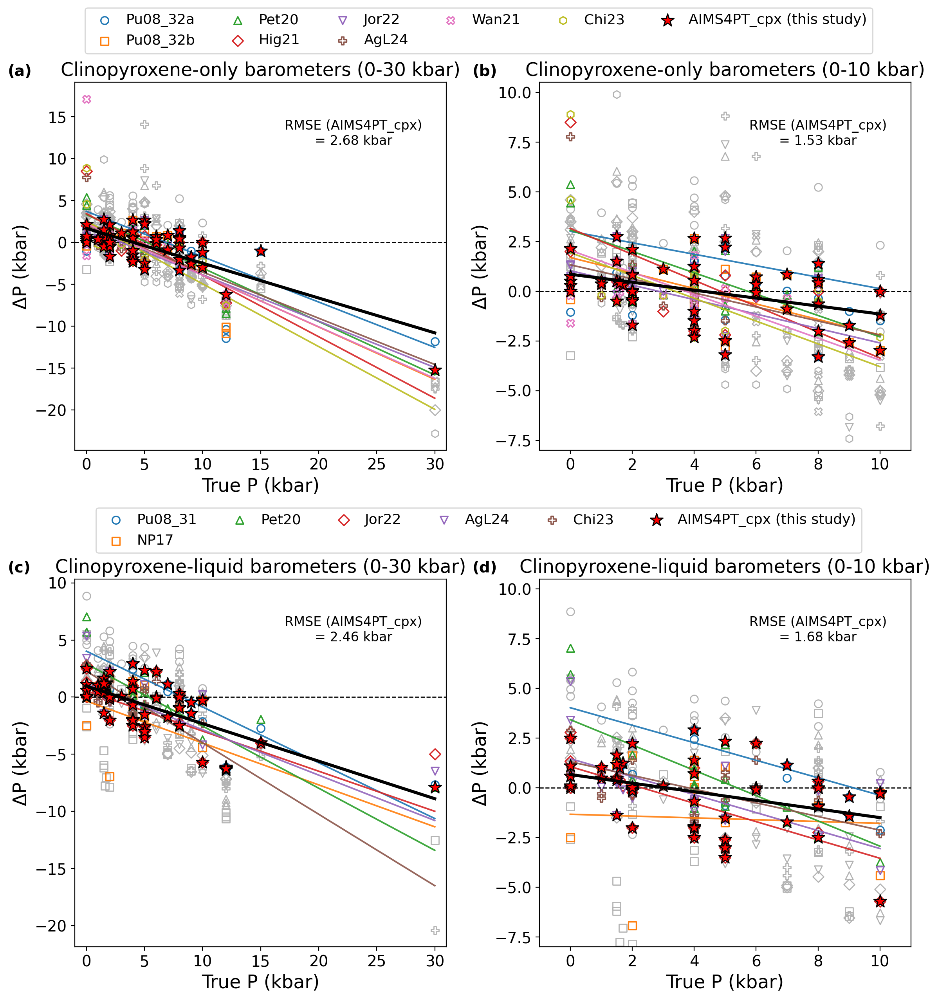

,model_name,slope,intercept,n_points,panel
0,Pu08_32a,-0.540769,3.703609,58,cpx_only_0_30_kbar
1,Pu08_32b,-0.624230,2.393886,53,cpx_only_0_30_kbar
2,Pet20,-0.637613,3.323100,59,cpx_only_0_30_kbar
3,Hig21,-0.733611,3.424852,59,cpx_only_0_30_kbar
4,Jor22,-0.552921,1.666035,59,cpx_only_0_30_kbar
5,AgL24,-0.551679,1.992435,59,cpx_only_0_30_kbar
6,Wan21,-0.615173,2.240479,58,cpx_only_0_30_kbar
7,Chi23,-0.748578,2.547856,59,cpx_only_0_30_kbar
8,AIMS4PT_cpx (this study),-0.415568,1.677804,55,cpx_only_0_30_kbar
9,Pu08_32a,-0.288401,3.012752,53,cpx_only_0_10_kbar


In [24]:

from aims4pt.model_tools.ModelManager import ModelManager
from paper.scripts.figure_helpers import (
    _add_panel_label__nb03_c27 as _add_panel_label,
    _dedupe_handles_labels__nb03_c27 as _dedupe_handles_labels,
    apply_figure_font_sizes,
    model_abbreviation_labels,
    plot_pressure_residual_panel__nb03_c27 as plot_pressure_residual_panel,
    save_figure_pdf_png,
)

from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt


P_cpx_only_pool = ModelManager.filter_models(P_model_pool, T_P="P", cpx_only=True)
P_cpx_only_cols = [m.model_name for m in P_cpx_only_pool]
P_cpx_only_labels = model_abbreviation_labels(P_cpx_only_cols, "P")

P_cpx_liq_pool = ModelManager.filter_models(P_model_pool, T_P="P", cpx_only=False)
P_cpx_liq_cols = [m.model_name for m in P_cpx_liq_pool]
P_cpx_liq_labels = model_abbreviation_labels(P_cpx_liq_cols, "P")

fig, axes = plt.subplots(2, 2, figsize=(12, 12), dpi=200, constrained_layout=False)

axes[0, 0], (h00, l00), slopes_00 = plot_pressure_residual_panel(
    P_real, predicted_P_df,
    model_cols=P_cpx_only_cols,
    model_labels=P_cpx_only_labels,
    workflow_col="workflow_P_cpx_only",
    P_min=0, P_max=30,
    ax=axes[0, 0],
    title="Clinopyroxene-only barometers (0-30 kbar)",
)

axes[0, 1], (h01, l01), slopes_01 = plot_pressure_residual_panel(
    P_real, predicted_P_df,
    model_cols=P_cpx_only_cols,
    model_labels=P_cpx_only_labels,
    workflow_col="workflow_P_cpx_only",
    P_min=0, P_max=10,
    ax=axes[0, 1],
    title="Clinopyroxene-only barometers (0-10 kbar)",
    y_lim=(-8, 10.5),
)

h0, l0 = _dedupe_handles_labels(h00 + h01, l00 + l01)

axes[1, 0], (h10, l10), slopes_10 = plot_pressure_residual_panel(
    P_real, predicted_P_df,
    model_cols=P_cpx_liq_cols,
    model_labels=P_cpx_liq_labels,
    workflow_col="workflow_P_cpx_liq",
    P_min=0, P_max=30,
    ax=axes[1, 0],
    title="Clinopyroxene-liquid barometers (0-30 kbar)",
)

axes[1, 1], (h11, l11), slopes_11 = plot_pressure_residual_panel(
    P_real, predicted_P_df,
    model_cols=P_cpx_liq_cols,
    model_labels=P_cpx_liq_labels,
    workflow_col="workflow_P_cpx_liq",
    P_min=0, P_max=10,
    ax=axes[1, 1],
    title="Clinopyroxene-liquid barometers (0-10 kbar)",
    y_lim=(-8, 10.5),
)

h1, l1 = _dedupe_handles_labels(h10 + h11, l10 + l11)

for ax, label in zip(axes.ravel(), ["(a)", "(b)", "(c)", "(d)"]):
    _add_panel_label(ax, label, x = -0.18, y=1.05)

fig.subplots_adjust(left=0.09, right=0.98, bottom=0.06, top=0.98, wspace=0.25, hspace=0.35)
fig.legend(h0, l0, loc="upper center", bbox_to_anchor=(0.52, 1.067), ncol=6, frameon=True, fontsize=13, handletextpad=0.5, columnspacing=2.0)
fig.legend(h1, l1, loc="upper center", bbox_to_anchor=(0.52, 0.535), ncol=6, frameon=True, fontsize=13, handletextpad=0.5, columnspacing=2.0)

pressure_slope_summary = pd.concat(
    [
        slopes_00.assign(panel="cpx_only_0_30_kbar"),
        slopes_01.assign(panel="cpx_only_0_10_kbar"),
        slopes_10.assign(panel="cpx_liq_0_30_kbar"),
        slopes_11.assign(panel="cpx_liq_0_10_kbar"),
    ],
    ignore_index=True,
)
cache_dir = Path(".cache")
cache_dir.mkdir(parents=True, exist_ok=True)
pressure_slope_summary.to_csv(cache_dir / "pressure_regression_slopes.csv", index=False)

apply_figure_font_sizes(fig)
save_figure_pdf_png(fig, IMAGES_DIR, "fig_s_pressure_results_regression_line")
plt.show()
display(pressure_slope_summary)


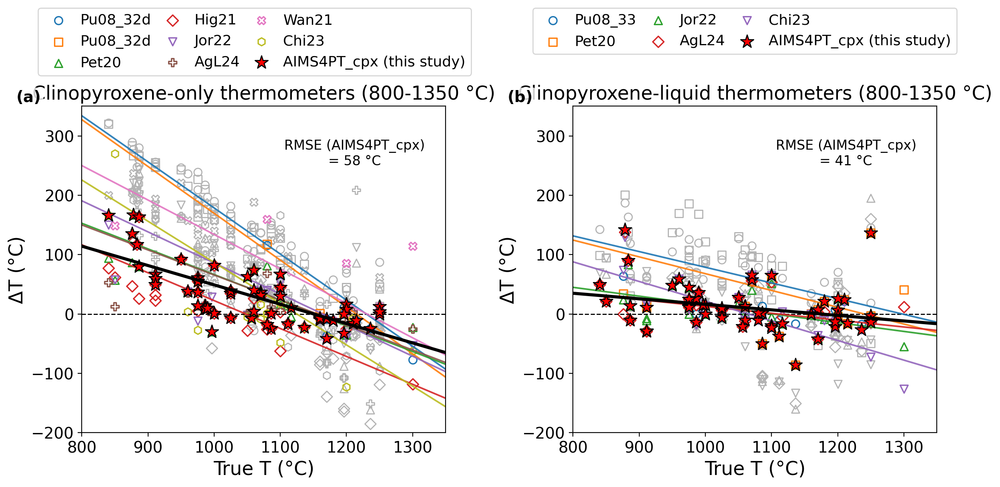

,model_name,slope,intercept,n_points,panel
0,Pu08_32d,-0.776257,954.877123,58,cpx_only_800_1350_C
1,Pu08_32d,-0.788684,958.302051,53,cpx_only_800_1350_C
2,Pet20,-0.431871,498.331299,59,cpx_only_800_1350_C
3,Hig21,-0.469947,492.499277,59,cpx_only_800_1350_C
4,Jor22,-0.523416,609.414488,59,cpx_only_800_1350_C
5,AgL24,-0.421337,487.112711,59,cpx_only_800_1350_C
6,Wan21,-0.580104,714.089094,59,cpx_only_800_1350_C
7,Chi23,-0.694335,781.128693,59,cpx_only_800_1350_C
8,AIMS4PT_cpx (this study),-0.325947,375.027763,55,cpx_only_800_1350_C
9,Pu08_33,-0.264274,343.014287,53,cpx_liq_800_1350_C


In [25]:

from aims4pt.model_tools.ModelManager import ModelManager
from paper.scripts.figure_helpers import (
    _add_panel_label__nb03_c29 as _add_panel_label,
    apply_figure_font_sizes,
    model_abbreviation_labels,
    plot_temperature_residual_panel__nb03_c29 as plot_temperature_residual_panel,
    save_figure_pdf_png,
)

from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt


T_cpx_only_pool = ModelManager.filter_models(T_model_pool, T_P="T", cpx_only=True)
T_cpx_only_cols = [m.model_name for m in T_cpx_only_pool]
T_cpx_only_labels = model_abbreviation_labels(T_cpx_only_cols, "T")

T_cpx_liq_pool = ModelManager.filter_models(T_model_pool, T_P="T", cpx_only=False)
T_cpx_liq_cols = [m.model_name for m in T_cpx_liq_pool]
T_cpx_liq_labels = model_abbreviation_labels(T_cpx_liq_cols, "T")

fig, axes = plt.subplots(1, 2, figsize=(12, 6), dpi=200, constrained_layout=False)

axes[0], (h0, l0), slopes_0 = plot_temperature_residual_panel(
    T_real, predicted_T_df,
    model_cols=T_cpx_only_cols,
    model_labels=T_cpx_only_labels,
    workflow_col="workflow_T_cpx_only",
    T_min=800, T_max=1350,
    ax=axes[0],
    title="Clinopyroxene-only thermometers (800-1350 °C)",
    y_lim=(-200, 350),
)

axes[1], (h1, l1), slopes_1 = plot_temperature_residual_panel(
    T_real, predicted_T_df,
    model_cols=T_cpx_liq_cols,
    model_labels=T_cpx_liq_labels,
    workflow_col="workflow_T_cpx_liq",
    T_min=800, T_max=1350,
    ax=axes[1],
    title="Clinopyroxene-liquid thermometers (800-1350 °C)",
    y_lim=(-200, 350),
)

_add_panel_label(axes[0], "(a)", x=-0.18, y=1.05)
_add_panel_label(axes[1], "(b)", x=-0.18, y=1.05)

fig.subplots_adjust(left=0.09, right=0.98, bottom=0.12, top=0.8, wspace=0.35)
fig.legend(h0, l0, loc="upper center", bbox_to_anchor=(0.27, 1.02), ncol=3, frameon=True, fontsize=13, handletextpad=0.5, columnspacing=0.5)
fig.legend(h1, l1, loc="upper center", bbox_to_anchor=(0.78, 1.02), ncol=3, frameon=True, fontsize=13, handletextpad=0.5, columnspacing=0.5)

temperature_slope_summary = pd.concat(
    [
        slopes_0.assign(panel="cpx_only_800_1350_C"),
        slopes_1.assign(panel="cpx_liq_800_1350_C"),
    ],
    ignore_index=True,
)
cache_dir = Path(".cache")
cache_dir.mkdir(parents=True, exist_ok=True)
temperature_slope_summary.to_csv(cache_dir / "temperature_regression_slopes.csv", index=False)

apply_figure_font_sizes(fig)
save_figure_pdf_png(fig, IMAGES_DIR, "fig_s_temperature_results_regression_line")
plt.show()
display(temperature_slope_summary)
